# WELCH 2018 

<br />
TIMELINE AND SUMMARY:

> WEEK 1 (JUL23 - JUL27):  
Gathered information on topological quantum computing, anyons, and braid theory. Brushed up on some Python syntax and searched for appropriate Python graphics modules. Discussed challenges and research goals with Dr. Hamilton. 
  
> WEEK 2 (JUL30 - AUG3):  
Coded a working implementation of a class for the n-strand braid group. Coded a function to draw braid objects using Python Turtle Graphics. Coded a lattice class with simple visualizations of 'holes' in the lattice.

> WEEK 3 (AUG6 - AUG10):
Modified braid class in order to allow for periodic boundary crossing of the edge strands. Coded a new function to draw braid objects with Matplotlib (DrawBraid), discontinuing work on the Turtle graphics implementation.  

> WEEK 4 (AUG13 - AUG17):  
Coded a random walk of n particles on a 2D lattice with periodic boundary conditions. Attempted to automate the analysis of the crossings between the particles as projected onto the XZ and YZ planes, creating braid objects with corresponding sets of generators. Switched to a linked list to store and process the generators. Wrote a method to simplify braids by finding equivalent ones with the lowest number of generators.


UPDATES:

> 3 SEP 2018:  
Introduced some modifications to the structure of the lattice class. The plotting and animation methods are no longer part of the class, but rather self-standing functions taking a lattice object as input (just like DrawBraid).

> 4 SEP 2018: 
Modified the structure of the build_strands method in the braid class. Created several subroutines in order to package reusable code for specific subtasks (exchange_inside, exchange_boundary, identity, append_history). Output is still the same.


USEFUL RESOURCES:

[A Short Introduction to Quantum Computation](https://arxiv.org/pdf/1705.04103.pdf) [V.T. Lathinen, J.K. Pachos]

[Introduction to abelian and non-abelian anyons](https://arxiv.org/abs/1610.09260) [S. Rao]

[Introduction to topological quantum computation with non-abelian anyons](https://arxiv.org/pdf/1802.06176.pdf) [B. Fiels, T. Simula]

[Cellular-automaton decoders for topological quantum memories](https://arxiv.org/pdf/1406.2338.pdf) [M. Herold, E.T. Campbell, J. Eisert, M. J. Kastoryano]

[The Strange Topology That is Reshaping Physics](https://www.nature.com/news/the-strange-topology-that-is-reshaping-physics-1.22316) [D. Castelvecchi]

[Theory of Braids](https://www.maths.ed.ac.uk/~v1ranick/papers/artinbraids.pdf) [E. Artin]

[Algorithmic Problems in the Braid Group](https://arxiv.org/pdf/math/0305205.pdf) [E. Feder]

[Braid Matrices and Quantum Gates for Ising Anyons Topological Quantum Computation](https://arxiv.org/pdf/1003.1253.pdf) [Z. Fan, H. De Garis]

[Braiding Operators are Universal Quantum Gates](https://arxiv.org/pdf/quant-ph/0401090.pdf) [L.H. Kauffman, S.J. Lomonaco]

[Braids, the Artin Group, and the Jones Polynomial](http://www.math.ucla.edu/~radko/191.1.05w/jordan.pdf) [J.Fassler]

[Topological Phases](https://boulderschool.yale.edu/sites/default/files/files/pt_article_published.pdf) [N. Read]

NOTES:

!!! This file consists of a few different things pasted together. It also lacks good comments. I'm still working on it. !!!   

#### SPECIAL MATH/DATA ROUTINES

In [1]:
# %load ../src/utilities.py
class utilities:
   
    def is_number(n):
        try:
            float(n)
            return True
        except:
            return False
        
    def is_integer(n):
        try:
            if int(n) is n:
                return True
            else:
                return False
        except ValueError:
            return False
    
    def index(lst, val):
        for idx, subl in enumerate(lst):
            if subl == val:
                return idx           
            elif isinstance(subl, list):
                for x in (x for x in subl if x is val):
                    return idx
        raise ValueError('Not in list or sublist.')


#### DOUBLY-LINKED LISIT IMPLEMENTATION FOR STORING AND MANIPULATING GENERATORS

For the sake of compressing braids, the generators will be stored in a doubly-linked list. This allows for easy, constant-time insertion and removal of generator pairs.

In [2]:
# %load src/llist.py
class Node:
    
    def __init__(self, data, n_prev = None, n_next = None):
        self.data = data
        self.next = n_next
        self.prev = n_prev

class LinkedList:
    
    def __init__(self, generators): 
        self.head = None
        self.tail = None
        for gen in generators:
            self.push(gen)
    
    def __len__(self):
        length = 0
        current = self.head
        while current is not None:
            if current.data != 0 and utilities.is_integer(current.data):
                length += 1
            current = current.next
        return length
    
    def __iter__(self):
        current = self.head
        while current is not None:
            yield current.data
            current = current.next
    
    def push(self, data):
        if self.head is None:
            self.head = self.last = Node(data, None, None)
        else:
            self.last.next =  Node(data, self.last, None)
            self.last = self.last.next
    
    def pad_zero(self):
        if self.head is not None:
            self.head.prev = self.head = Node(0, None, self.head)
        else:
            self.head = Node(0, None, None)
            
    def strip_zero(self):
        self.head = self.head.next
    
    def remove_pairs(self):
        self.pad_zero()
        current = self.head.next
        while current is not None:
            if current.data == -(current.prev.data):
                current.prev.prev.next = current.next
                if current.next is not None:
                    current.next.prev = current.prev.prev
            current = current.next
        if self.head and self.head.next:
            self.strip_zero()


### DEFINING A CLASS FOR THE BRAID GROUP

A braid can be intuitively defined as a set of strands which are laid out in a particular direction. 
We can imagine each string being generated by a point monotonically traveling in the direction defined by an arbitrary axis, which we call the direction axis. The strands can be woven with one another, but they cannot form any knots.

The braid group of n strands (denoted $B_{n}$), also known as the Artin braid group, is the group whose elements are equivalence classes of n-braids (e.g. under ambient isotopy), and whose group operation is composition of braids.

One method of defining a group is by a presentation. One specifies two sets ($S$ and $R$): the set $S$ of generators so that every element of the group can be written as a product of powers of some of these generators, and the set $R$ containing all the relations that we want the generators to obey. We then say $G$ has presentation $\langle  S  \vert  R  \rangle$, and write:

$$G = \langle S \vert R \rangle$$

In case of the n-string braid group ($B_n$), all elements of the group (which we call n-braids) can be obtained from a finite number of elementary braids, called generators. This suggests the possibility of an abstract presentation of the n-braid group as described above. The following theorem, due to Emil Artin, provides us with two types of relations between $n-1$ generators which are sufficient to define a n-order braid group in its completeness.

Theorem: The group $B_n$ can be defined through the following presentation:

$$B_n = \langle\,\sigma_{1},...,\sigma_{n-1}\,\mid\,\sigma_{i} \sigma_{i+1} \sigma_{i} = \sigma_{i+1}\sigma_{i}\sigma_{i+1},\,
        \sigma_{i} \sigma_{j} = \sigma_j\sigma_i\,\rangle$$

where in the first group of relations $1\leq i\leq n-2$ and in the second group of relations, $\mid\,i-j\mid\,\geq 2$. 

#### PERIODIC BRAIDS

For the purposes of visualizing anyonic operations happening on topologically non-trivial manifolds, we will need to extend the concept of braid in a couple of ways.  
First, we need to implement periodic boundary conditions of the edge strands.
For a toric manifold, the strands should be allowed to cross in and out of the boundary, just as if they were laid out on a circle (or more generally, any closed curve). 

(Tori are homeomorphic to the cartesian product of two circles; this cyclical nature gives rise to the periodicity.)

In order to do this, we could create a generalized braid class, with partial inheritance of the attributes and methods from the standard braid class, expanding its possibilities to encompass what we described above.

However, for the sake of simplicity, I decided to keep a single class and retain the name "braid" for it. Hence, let the following be clear: a "braid" object, as part of this module, will NOT represent (in general) an element of the Artin braid group. This means that some operations that we can perform on braids (such as concatenation 'adding', or taking an inverse) won't be able to be applied after any of the strands have been fused together.

In [3]:
# %load ../src/braid.py
class braid:
        
    def __init__(self, nstrands, generators):      
        self.nstrands = nstrands
        self.history = []
        self.nstrand_history = []
        self.boundaries_history = []
        
        def setup_structures(self):
            self.generators = LinkedList(generators)
            self.strands = [[] for _ in range(nstrands)]
            self.sequence = [[_] for _ in range(nstrands)]
            self.boundaries = [0, self.nstrands - 1]
        
        setup_structures(self)
        self.build_strands()           

    def standard_exchange(self, gen, direction):
            
        if (direction is 'positive'):
                
            '''Add twist moves to the two strands'''
            for _ in self.sequence[gen - 1]:
                self.strands[_].append('RU')
            for _ in self.sequence[gen]:
                self.strands[_].append('LO')
            '''Add non-movements to all the other strands'''
            for _ in range(gen - 1):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            for _ in range(gen + 1, self.nstrands):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')  
            '''Update the strand sequence (swap placeholders for the two strands)'''
            self.sequence[gen - 1], self.sequence[gen] = self.sequence[gen], self.sequence[gen - 1] 
            
        else:
            '''Add twist moves to the two strands'''
            for _ in self.sequence[gen - 1]:
                self.strands[_].append('RO')
            for _ in self.sequence[gen]:
                self.strands[_].append('LU')
            '''Add non-movements to all the other strands'''
            for _ in range(gen - 1):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            for _ in range(gen + 1, self.nstrands):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            '''Update the strand sequence (swap placeholders for the two strands)'''
            self.sequence[gen - 1], self.sequence[gen] = self.sequence[gen], self.sequence[gen - 1]
   
    def boundary_exchange(self, direction):
        
        if (direction is 'positive'):
            '''Swap edge strands across the boundary'''
            for _ in self.sequence[self.nstrands - 1]:
                self.strands[_].append('OO')
            for _ in self.sequence[0]:
                self.strands[_].append('IU')
            '''Add non-movements to all the other strands'''
            for _ in range(1, self.nstrands - 1):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            '''Update string sequence (swap string placeholders)'''
            self.sequence[0], self.sequence[self.nstrands - 1] = self.sequence[self.nstrands - 1], self.sequence[0]

        else:
            '''Swap edge strands across the boundary'''
            for _ in self.sequence[self.nstrands - 1]:
                self.strands[_].append('OU')
            for _ in self.sequence[0]:
                self.strands[_].append('IO')
            '''Add non-movements to all the other strands'''
            for _ in range(1, self.nstrands - 1):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            '''Update string sequence (swap string placeholders)'''
            self.sequence[0], self.sequence[self.nstrands - 1] = self.sequence[self.nstrands - 1], self.sequence[0]
            
    def standard_fusion(self, gen, direction):
        
        if (direction is 'positive'):
            '''Append merging move'''
            for _ in self.sequence[gen]:
                self.strands[_].append('FR')
            '''Add non-movements to all the other strands'''
            for _ in range(0, gen):
                for __ in self.sequence[_]:
                    self.strands[__].append('RO')
            for _ in range(gen + 1, self.nstrands):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            '''Merge the strand into the right one'''
            self.sequence[gen + 1] += self.sequence[gen]
            '''Delte the old strand placeholder'''
            del self.sequence[gen]
            '''Decrease number of strands to control'''
            self.nstrands -= 1
            
        else:
            '''Append merging move'''
            for _ in self.sequence[gen]:
                self.strands[_].append('FL')
            '''Add non-movements to all the other strands'''
            for _ in range(0, gen):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')
            for _ in range(gen + 1, self.nstrands):
                for __ in self.sequence[_]:
                    self.strands[__].append('LO')
            '''Merge the strand into the left one'''
            self.sequence[gen - 1] += self.sequence[gen]
            '''Delte the old strand placeholder'''
            del self.sequence[gen]
            '''Decrease number of strands to control'''
            self.nstrands -= 1
            
    def identity(self):
            '''This is the identity. No need to swap anything.'''
            for _ in range(0, self.nstrands):
                for __ in self.sequence[_]:
                    self.strands[__].append('NO')   
   
    def append_history(self):
        
        from copy import deepcopy
        self.history.append(deepcopy(self.sequence))
        self.nstrand_history.append(deepcopy(self.nstrands))
        self.boundaries_history.append(deepcopy(self.boundaries))
                    
    def build_strands(self):             

        #Store initial configuration for t=0
        self.append_history()

        #Loop over each generator, performing the operation it encodes
        for gen in self.generators: 
        
            if isinstance(gen, str):
                if gen[0] is not '-':
                    self.standard_fusion(int(gen[0]), 'positive')
                    self.boundaries[0] += 1
                    self.append_history()
                else:
                    self.standard_fusion(int(gen[1]), 'negative')
                    self.boundaries[1] -= 1
                    self.append_history()
                
            elif (abs(gen) < self.nstrands):
                if gen > 0:
                    self.standard_exchange(gen, 'positive')
                    self.append_history()
                elif gen < 0:
                    self.standard_exchange(-gen, 'negative')
                    self.append_history()
                else:
                    self.identity()
                    self.append_history() 
                    
            elif (abs(gen) == self.nstrands > 1):
                if gen == self.nstrands:
                    self.boundary_exchange('positive')
                    self.append_history()
                else:
                    self.boundary_exchange('negative')
                    self.append_history()
            
            else:
                raise ValueError('Generator value incompatible.')
  
    def __iter__(self):
        self.iterator = iter(self.strands)
        return (self.iterator)
    
    def __next__(self):
        next(self.iterator)
        return(self.iterator)
    
    def __add__(self, other):  
        return braid(max(self.nstrands, other.nstrands), list(self.generators) + list(other.generators))
    
    def __mul__(self, other):
        return braid(self.nstrands, list(self.generators) * other)
    
    def __rmul__(self, other):      
        return braid(self.nstrands, list(self.generators) * other)
    
    def __len__(self):
        return len(self.generators)
        
    def Compress(self):
        self.generators.remove_pairs()
        self.__init__(self.nstrands, self.generators)

    def PrintMoves(self):
        for string, moves in enumerate(self.strands):
            print('STR{}:\t{}'.format(string, moves))
    
    def PrintHistory(self):
        for idx, moves in enumerate(self.history):
            print('t = {}:\t{}'.format(idx, moves))
             
    def PrintGenerators(self):
        for idx, gen in enumerate(self.generators):  
            print(gen)


### DRAWING BRAIDS WITH MATPLOTLIB

In [4]:
# %load ../src/draw_braid.py
def DrawBraid(braid, orientation = 'v', vstretch = 2, colors = True, annotations = False, save_name = None):
    
    import matplotlib.pyplot as plt
    import numpy as np
    
    VSTRETCH = vstretch
    HSPACING = 0
    VSPACING = 0
    SMOOTHNESS = 100
    MARKERSIZE = 100
    
    # Set figure size based on number of strands and number of moves.
    # User-defined parameters allow for stretching/shrinking the strands. 
    if orientation is 'v':
        plt.figure(figsize = (braid.nstrand_history[0] + HSPACING, len(braid.strands[0]) * VSTRETCH + VSPACING))
    else:
        plt.figure(figsize = (len(braid.strands[0]) * VSTRETCH + VSPACING, braid.nstrand_history[0] + HSPACING))
    
    # Alias custom index function
    index = utilities.index
    
    def select_color(i):
        
        COLORS = ['#FFE119', '#0082C8', '#E6194B', '#3CB44B', '#F58231', '#911EB4',
                  '#46F0F0', '#FABEBE', '#008080', '#FFFAC8', '#800000', '#E6BEFF',
                  '#AA6E28', '#F032E6', '#D2F53C', '#AAFFC3', '#808000', '#FFD8B1',
                  '#000080', '#808080', '#000000']
    
        if (colors is True):
            return COLORS[i]
        else:
            return COLORS[20]
        
    def plot_v():
            
        # Retrieve left boundary value at time t
        b = braid.boundaries_history[t][0]
            
        if (move == 'RO'):    
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'RU'):    
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 0.4 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
            x = np.linspace(index(braid.history[t],nstr) + 0.6 + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'LO'):  
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'LU'):
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) - 0.6 + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
            x = np.linspace(index(braid.history[t],nstr) - 0.4 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)

        elif (move == 'OO'):
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 0, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(-1, 0, SMOOTHNESS) + b
            y = np.arcsin(np.linspace(0, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'OU'):
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 0.8 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(-0.8, 0, SMOOTHNESS) + b
            y = np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                    
        elif (move == 'IO'):
            x = np.linspace(-1, 0, SMOOTHNESS) + b
            y = -np.arcsin(np.linspace(0, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(braid.nstrand_history[t] - 1 + b, braid.nstrand_history[t] + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 0, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'IU'):
            x = np.linspace(index(braid.history[t],nstr) - 0.8 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(braid.nstrand_history[t] - 1 + b, braid.nstrand_history[t] - 0.2 + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)

        elif (move == 'FR'):         
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'FL'):             
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
                                                
        else:
            x = [index(braid.history[t],nstr) + b] * SMOOTHNESS
            y = np.linspace(t * np.pi, (t+1) * np.pi, SMOOTHNESS)
            plt.plot(x, y, color = select_color(nstr), ms = MARKERSIZE)
    
    def plot_h():
        
        # Retrieve left boundary value at time t
        b = braid.boundaries_history[t][0]
            
        if (move == 'RO'):    
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'RU'):    
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 0.4 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
            x = np.linspace(index(braid.history[t],nstr) + 0.6 + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'LO'):  
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'LU'):
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) - 0.6 + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
            x = np.linspace(index(braid.history[t],nstr) - 0.4 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)

        elif (move == 'OO'):
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 0, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(-1, 0, SMOOTHNESS) + b
            y = np.arcsin(np.linspace(0, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'OU'):
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 0.8 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(-0.8, 0, SMOOTHNESS) + b
            y = np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                    
        elif (move == 'IO'):
            x = np.linspace(-1, 0, SMOOTHNESS) + b
            y = -np.arcsin(np.linspace(0, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
            x = np.linspace(braid.nstrand_history[t] - 1 + b, braid.nstrand_history[t] + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 0, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'IU'):
            x = np.linspace(index(braid.history[t],nstr) - 0.8 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(0.2, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                    
            x = np.linspace(braid.nstrand_history[t] - 1 + b, braid.nstrand_history[t] - 0.2 + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, -0.2, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)

        elif (move == 'FR'):         
            x = np.linspace(index(braid.history[t],nstr) + b, index(braid.history[t],nstr) + 1 + b, SMOOTHNESS)
            y = np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                
        elif (move == 'FL'):             
            x = np.linspace(index(braid.history[t],nstr) - 1 + b, index(braid.history[t],nstr) + b, SMOOTHNESS)
            y = -np.arcsin(np.linspace(-1, 1, SMOOTHNESS)) + (t * np.pi) + np.pi / 2
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)
                                                
        else:
            x = [index(braid.history[t],nstr) + b] * SMOOTHNESS
            y = np.linspace(t * np.pi, (t+1) * np.pi, SMOOTHNESS)
            plt.plot(y, x, color = select_color(nstr), ms = MARKERSIZE)    

    def annotate_v(): 
        for t, state in enumerate(braid.history):
            for nstr, strand in enumerate(state):
                annotation = ''
                for n in sorted(strand):
                    annotation += str(n)
                plt.text(nstr + braid.boundaries_history[t][0], t * np.pi, annotation)
                
    def annotate_h(): 
        for t, state in enumerate(braid.history):
            for nstr, strand in enumerate(state):
                annotation = ''
                for n in sorted(strand):
                    annotation += str(n)
                plt.text(t * np.pi, nstr + braid.boundaries_history[t][0], annotation)
    
    '''DRAW STRANDS'''
    for nstr, moves in enumerate(braid.strands):    
        for t, move in enumerate(moves):
            plot_v() if (orientation is 'v') else plot_h()
            
    '''ANNOTATE (IF APPLICABLE)'''
    if (annotations):
        annotate_v() if orientation is 'v' else annotate_h()
                    
    '''SAVE FIGURE (IF APPLICABLE)'''
    if (save_name != None):
        plt.savefig(save_name, format = 'pdf')



#### TESTING

In [5]:
%matplotlib inline
'''UNCOMMENT LINE BELOW TO USE SVG BACKEND'''
#%config InlineBackend.figure_format = 'svg'
'''UNCOMMENT LINE BELOW TO USE JPG BACKEND'''
%config InlineBackend.figure_format = 'jpg'

STR0:	['RU', 'RU', 'NO', 'RU', 'OO', 'FR', 'RU', 'LO', 'NO', 'NO', 'FR', 'NO']
STR1:	['LO', 'NO', 'RU', 'NO', 'NO', 'NO', 'RU', 'LO', 'NO', 'NO', 'FR', 'NO']
STR2:	['NO', 'LO', 'LO', 'NO', 'IU', 'NO', 'NO', 'NO', 'LO', 'NO', 'NO', 'NO']
STR3:	['NO', 'NO', 'NO', 'LO', 'NO', 'NO', 'LO', 'RU', 'FL', 'NO', 'FR', 'NO']
t = 0:	[[0], [1], [2], [3]]
t = 1:	[[1], [0], [2], [3]]
t = 2:	[[1], [2], [0], [3]]
t = 3:	[[2], [1], [0], [3]]
t = 4:	[[2], [1], [3], [0]]
t = 5:	[[0], [1], [3], [2]]
t = 6:	[[1, 0], [3], [2]]
t = 7:	[[3], [1, 0], [2]]
t = 8:	[[1, 0], [3], [2]]
t = 9:	[[1, 0, 3], [2]]
t = 10:	[[1, 0, 3], [2]]
t = 11:	[[2, 1, 0, 3]]
t = 12:	[[2, 1, 0, 3]]


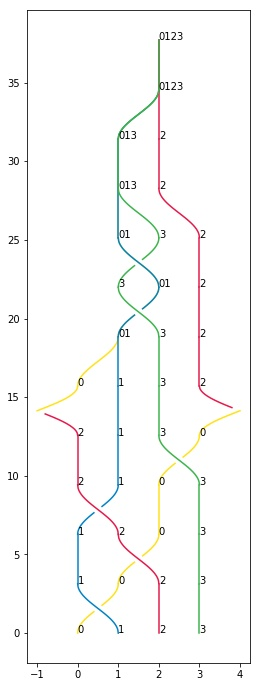

In [6]:
# Random example of anyon braiding with periodic boundary crossings (with fusions)

B = braid(4, [1, 2, 1, 3, 4, '0', 1, 1, '-1', 0, '0', 0])
B.PrintMoves()
B.PrintHistory()

DrawBraid(B, orientation = 'v', annotations = True, vstretch = 1, save_name = 'fusion')

STR0:	['RU', 'LO', 'NO', 'RU', 'RU', 'NO', 'NO', 'NO', 'NO']
STR1:	['LO', 'RU', 'NO', 'LO', 'NO', 'NO', 'IU', 'NO', 'OU']
STR2:	['NO', 'NO', 'RO', 'NO', 'NO', 'RU', 'OO', 'NO', 'IO']
STR3:	['NO', 'NO', 'LU', 'NO', 'LO', 'NO', 'NO', 'NO', 'NO']
STR4:	['NO', 'NO', 'NO', 'NO', 'NO', 'LO', 'NO', 'NO', 'NO']


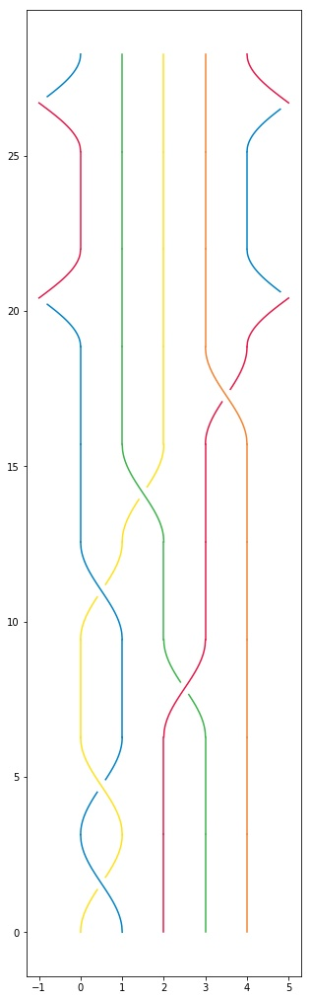

In [7]:
# Random example of braiding with periodic boundary crossings (no fusions)

B = braid(5, generators = [1, 1, -3, 1, 2, 4, 5, 0, -5])
B.PrintMoves()
DrawBraid(B)

STR0:	['RU', 'LO']
STR1:	['LO', 'RU']


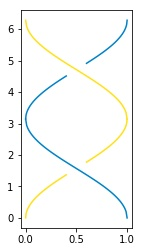

In [8]:
# Composition of sigma_{1} with itself in a 2-stranded braid group 
# This corresponds to a full twist of the two strands

B = braid(2, [1, 1])

B.PrintMoves()
DrawBraid(B)

STR0:	['RU', 'LU']
STR1:	['LO', 'RO']


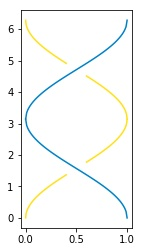

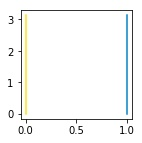

In [9]:
# Twisting and un-twisting of two strands in a 2-strand braid group. Applying sigma_{1} produces a half twist,
# Applying sigma_{-1} undoes the twist. Hence, the resulting braid is equivalent to the identity braid.

B = braid(2, [1, -1])

B.PrintMoves()
DrawBraid(B, vstretch = 2)

B.Compress()
DrawBraid(B, vstretch = 2)

STR0:	['RU', 'RO', 'NO', 'RU', 'NO', 'NO', 'NO', 'LU', 'LU']
STR1:	['LO', 'NO', 'RU', 'NO', 'RU', 'NO', 'LO', 'NO', 'RO']
STR2:	['NO', 'LU', 'LO', 'NO', 'NO', 'RU', 'RU', 'RO', 'NO']
STR3:	['NO', 'NO', 'NO', 'LO', 'LO', 'LO', 'NO', 'NO', 'NO']
t = 0:	[[0], [1], [2], [3]]
t = 1:	[[1], [0], [2], [3]]
t = 2:	[[1], [2], [0], [3]]
t = 3:	[[2], [1], [0], [3]]
t = 4:	[[2], [1], [3], [0]]
t = 5:	[[2], [3], [1], [0]]
t = 6:	[[3], [2], [1], [0]]
t = 7:	[[3], [1], [2], [0]]
t = 8:	[[3], [1], [0], [2]]
t = 9:	[[3], [0], [1], [2]]


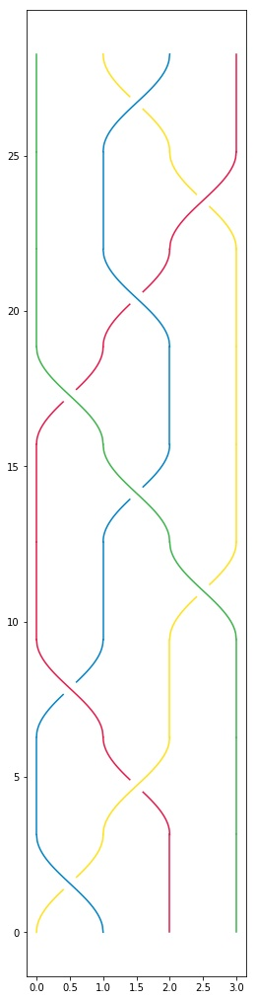

In [10]:
B = braid(4, [1, -2, 1, 3, 2, 1, 2, -3, -2])

B.PrintMoves()
B.PrintHistory()

DrawBraid(B, vstretch = 2)

In [11]:
# Composition of two braids.

B1 = braid(4, [1, -3, 2])
B2 = braid(3, [1, 2, 1])

M = B1 + B2
N = B2 + B1

M.PrintMoves()
print()
N.PrintMoves()

STR0:	['RU', 'NO', 'RU', 'NO', 'LO', 'LO']
STR1:	['LO', 'NO', 'NO', 'RU', 'RU', 'NO']
STR2:	['NO', 'RO', 'NO', 'NO', 'NO', 'NO']
STR3:	['NO', 'LU', 'LO', 'LO', 'NO', 'RU']

STR0:	['RU', 'RU', 'NO', 'NO', 'RO', 'NO']
STR1:	['LO', 'NO', 'RU', 'LO', 'NO', 'NO']
STR2:	['NO', 'LO', 'LO', 'RU', 'NO', 'RU']
STR3:	['NO', 'NO', 'NO', 'NO', 'LU', 'LO']


#### RANDOM WALK OF N QUASIPARTICLES ON A LATTICE WITH PERIODIC BOUNDARY CONDITIONS

Our system is initialized as a finite square lattice of fixed dimensions, with periodic boundary conditions at the edges. Particles are randomly sampled without repetition from the set of all possible lattice coordinates. The system undergoes a discrete random time evolution, during which the particles are allowed to move subject to physical constraints.

In [12]:
#random.sample takes a population and a sample size k
#and returns k random members of the population

#### PLOTTING TIME EVOLUTION IN 2+1 DIMENSIONS

By virtue of the topological argument described above, quasiparticle excitations with anyonic statistics can only arise in systems where motion is confined to two dimensions.  
  
Consider a 2+1 dimensional space, where the anyons are spatially confined to a plane, and the third dimension is time. As the anyons move in the plane, they trace worldlines in this 2+1 dimensional space.

In [13]:
class lattice:
            
    def __init__(self, width, height, woffset = 0, hoffset = 0):       
        self.width = width
        self.height = height
        self.woffset = woffset
        self.hoffset = hoffset
        
        def setup_structures(self):
            self.lattice = [[[] for w in range(width)] for h in range(height)]
            self.nparticles = 0
    
        def random_init():
            import random
            random.seed()
        
        setup_structures(self)
        random_init()
    
    def add_particle(self):
        import random  
        '''Compute coordinates within the lattice dimensions'''
        x = random.randint(0, self.width - 1)
        y = random.randint(0, self.height - 1)
        '''Check if the spot is already populated'''
        if self.lattice[x][y] == []:
            self.lattice[x][y].append(self.nparticles + 1)
            self.nparticles += 1
        else:
            self.add_particle()

    def AddParticles(self, n):
        for _ in range(n):
            self.add_particle()
        

In [14]:
L = lattice(50, 50, 3)

#### ANIMATING THE TIME-EVOLUTION OF THE SYSTEM

In order to animate the motion of the quasiparticles on the 2D lattice, I used the Matplotlib animation package. The FuncAnimation method makes an animation by repeatedly calling the function 'update'. 

In [15]:
def Animate2DMotion(lattice, grid = False):
        
    from matplotlib import animation
    import matplotlib.pyplot as plt
        
    INTERVAL_MS = 500 #inverse of frequency
    
    GRID_SPACING = 1
    TICK_XSPACING = 10
    TICK_YSPACING = 10
        
    COLORS = ['#FFE119', '#0082C8', '#E6194B', '#3CB44B', '#F58231', '#911EB4',
              '#46F0F0', '#FABEBE', '#008080', '#FFFAC8', '#800000', '#E6BEFF',
              '#AA6E28', '#F032E6', '#D2F53C', '#AAFFC3', '#808000', '#FFD8B1',
              '#000080', '#808080', '#000000']
        
    scatter_plots = []

    fig = plt.figure('Time Evolution')
    ax = fig.add_subplot(111)
    
    if grid is True:
        
        def setup_grid():
            import numpy as np
            minor_xticks = np.arange(-1, lattice.width, GRID_SPACING)
            major_xticks = np.arange(0, lattice.width, TICK_XSPACING)
            minor_yticks = np.arange(-1, lattice.width, GRID_SPACING)
            major_yticks = np.arange(0, lattice.width, TICK_YSPACING)
            ax.set_xticks(minor_xticks, minor = True)
            ax.set_xticks(major_xticks)
            ax.set_yticks(minor_yticks, minor = True)
            ax.set_yticks(major_yticks)
            ax.set_xlim(-1, lattice.width)
            ax.set_ylim(-1, lattice.height)
        
        setup_grid()
 
    ax.grid(which = 'both')
    ax.set_aspect('equal')
        
    def update(i):
            
        nonlocal scatter_plots
        nonlocal COLORS
        
        for plot in scatter_plots:
            plot.remove()
            
        scatter_plots = []
        ax.set_title('t = {}'.format(i))
                        
        for idx, p in enumerate(lattice.history[i]):
            scatter_plots.append(ax.scatter(p[0], p[1], color=COLORS[idx]))
    
    plt.close()

    anim = animation.FuncAnimation(fig, update, frames=lattice.TimeSteps, interval=INTERVAL_MS)
        
    anim.save('anim.gif', dpi=300, writer='imagemagick')

#### TESTING

After creating a lattice object initialized with quasiparticle excitations, we use the TimeEvolution method to evolve the system in discrete time steps.

__How does TimeEvolution work?__  
A function will randomly choose from the four directions in the Von-Neumann neighborhood of each particle, moving it accordingly. Before storing each particle's movement, the function checks for collisions with the other particles. If a collision is found, the previous state is restored, and the operation is repeated until reaching a state with no collisions. The larger the lattice, the smaller the probability of collisions.

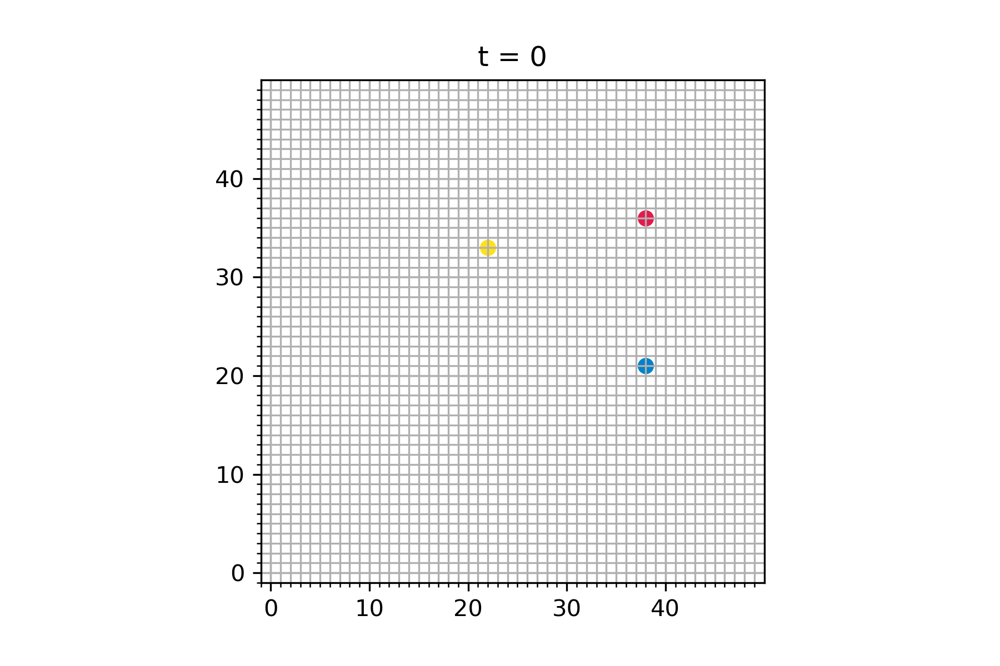

In [16]:
#Animate2DMotion(L, grid = True)

def display_gif(name):
    from IPython.display import Image
    '''Open GIF and Display on Jupyter'''
    with open('./' + name + '.gif','rb') as f:
        display(Image(data=f.read(), format='png'))
display_gif('anim')

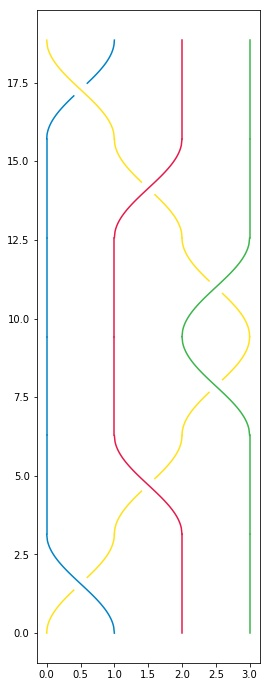

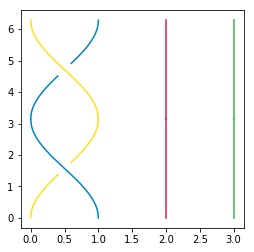

In [17]:
B = braid(4, [1, 2, 3, -3, -2, 1])

DrawBraid(B)

B.Compress()

DrawBraid(B)

In [18]:
def Plot2DLattice(lattice, color='k', save_name = None):
        
    import matplotlib.pyplot as plt

    MARKERSIZE = 50
    
    for w in range(lattice.width):
        for h in range(lattice.height):
                
            if (lattice.lattice[w][h] == []):                       
                plt.scatter(w, h, s = MARKERSIZE, c = color, alpha = 0.8)
            else:
                plt.scatter(w, h, marker = '+', s = MARKERSIZE, c = 'k', alpha = 0.3)
                #plt.text(w, h, lattice.lattice[w][h], color = 'k', alpha = 0.5, va = 'center', ha = 'center')
                
    if (save_name != None):
        plt.savefig(save_name, format = 'jpg')
            
    plt.show()

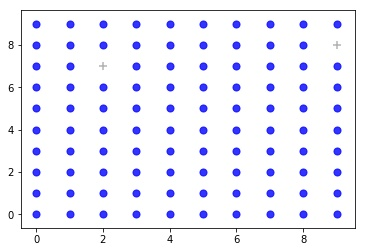

In [19]:
L = lattice(10, 10)
L.AddParticles(2)
Plot2DLattice(L, color = 'b', save_name = '2dlattice.jpg')

In [20]:
class evo:
    
    def __init__(self, initial_state, evo_length):
        self.initial_state = initial_state
        self.evo_length = evo_length
        self.state_history = []
        
        def setup_structures(self):
            self.lattice_width = initial_state.width
            self.lattice_height = initial_state.height
        
        setup_structures(self)
        self.random_evolution()
        
    def random_evolution(self):

        from copy import deepcopy
        
        POSSIBILITIES = ['N', 'S', 'W', 'E']
        
        def save_state(state):
            self.state_history.append(deepcopy(state))
                
        def move(x, y):
            
            import random
            choice = random.choice(POSSIBILITIES)
            
            if (choice == 'N'):
                if (y + 1) > (state.height - 1):
                    y = 0
                else:
                    y += 1
                    
            elif (choice == 'S'):
                if (y - 1) < 0:
                    y = (state.height - 1)
                else:
                    y -= 1
                    
            elif (choice == 'W'):
                if (x - 1) < 0:
                    x = (state.width - 1)
                else:
                    y -= 1
                    
            elif (choice == 'E'):
                if (x + 1) > (state.width - 1):
                    x = 0
                else:
                    x += 1
                    
            return (x, y)
        
        
        '''TIME EVOLUTION'''
        
        state = deepcopy(self.initial_state)
        
        for t in range(self.evo_length):
            save_state(state)
            moved = []
            for w in range(self.lattice_width):
                for h in range(self.lattice_height):
                    if state.lattice[w][h] != [] and state.lattice[w][h] not in moved:
                        x, y = move(w, h)
                        state.lattice[x][y] += state.lattice[w][h]
                        state.lattice[w][h] = []
                        moved.append(deepcopy(state.lattice[x][y]))
        

In [21]:
'''10-step random evolution of a lattice with 5 quasiparticles'''

E = evo(L, 10)

#for state in E.state_history:
#    Plot2DLattice(state, color = 'b', save_name = '2dlattice')

In [22]:
def SpaceTimePlot(evolution, interpolate = False):
            
    import matplotlib.pyplot as plt 
    from mpl_toolkits.mplot3d import Axes3D
        
    COLORS = ['#FFE119', '#0082C8', '#E6194B', '#3CB44B', '#F58231', '#911EB4',
              '#46F0F0', '#FABEBE', '#008080', '#FFFAC8', '#800000', '#E6BEFF',
              '#AA6E28', '#F032E6', '#D2F53C', '#AAFFC3', '#808000', '#FFD8B1',
              '#000080', '#808080', '#000000']
            
        
    plt.figure('Discrete Random Walk', figsize = (15, 10))
        
    axis1 = plt.subplot2grid((2, 2), (0, 0), colspan = 2, projection='3d')
    axis2 = plt.subplot2grid((2, 2), (1, 0))
    axis3 = plt.subplot2grid((2, 2), (1, 1))
        
    axis1.set_aspect('equal')
    axis2.set_aspect('equal')
    axis3.set_aspect('equal')
        
    axis1.set_title('3D View')
    axis2.set_title('XZ Projection')
    axis3.set_title('YZ Projection')
        
    for t in range(evolution.evo_length):
        for w in range(evolution.lattice_width):
            for h in range(evolution.lattice_height):
                if evolution.state_history[t].lattice[w][h] != []:
                    axis1.scatter(w, h, t, color = COLORS[evolution.state_history[t].lattice[w][h][0]])
                    axis2.scatter(w, t, color = COLORS[evolution.state_history[t].lattice[w][h][0]])
                    axis3.scatter(h, t, color = COLORS[evolution.state_history[t].lattice[w][h][0]])
    
    
    plt.show()

In [23]:
def SpaceTimePlot2(evolution, interpolate = False, color = 'k'):
            
    import matplotlib.pyplot as plt 
    from mpl_toolkits.mplot3d import Axes3D
    
    SPACING = 100
    MARKERSIZE = 100
        
    COLORS = ['#FFE119', '#0082C8', '#E6194B', '#3CB44B', '#F58231', '#911EB4',
              '#46F0F0', '#FABEBE', '#008080', '#FFFAC8', '#800000', '#E6BEFF',
              '#AA6E28', '#F032E6', '#D2F53C', '#AAFFC3', '#808000', '#FFD8B1',
              '#000080', '#808080', '#000000']
            
        
    fig = plt.figure('Discrete Random Walk', figsize = (15, 10))
        
    axis1 = fig.add_subplot(111, projection = '3d', aspect = 'equal')
                    
    for t in range(evolution.evo_length):
        for w in range(evolution.lattice_width):
            for h in range(evolution.lattice_height):
                if (evolution.state_history[t].lattice[w][h] == []):                       
                    axis1.scatter(w, h, t + SPACING, s = MARKERSIZE, c = color, alpha = 0.8)
                else:
                    axis1.scatter(w, h, t + SPACING, s = MARKERSIZE, c = 'r', alpha = 0.8)
                    pass
                    #axis1.text(w, h, evolution.state_history[t].lattice[w][h], color = 'k', alpha = 0.5, va = 'center', ha = 'center')
                    
    plt.show()

In [24]:
#SpaceTimePlot(E)

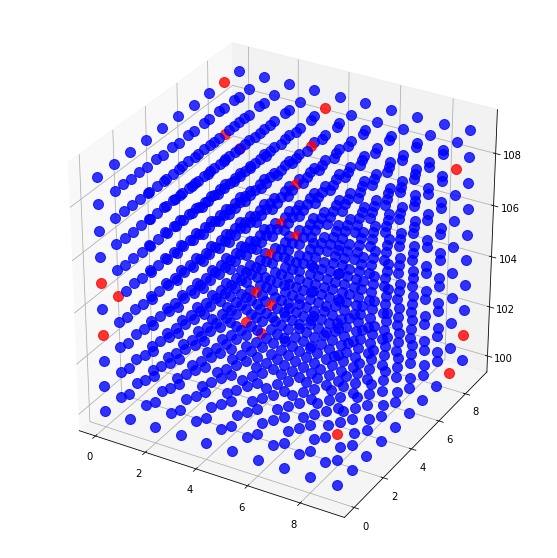

In [25]:
SpaceTimePlot2(E, color = 'b')

### APPENDIX 1: USEFUL VISUALIZATIONS

Contents:
 * Optical Lattice (surface)
 * Optical Lattice (wireframe + particles)
 * Torus (surface)
 * Torus (slices on a 2D plane)
 * Torus (surface + projection)

#### OPTICAL LATTICE

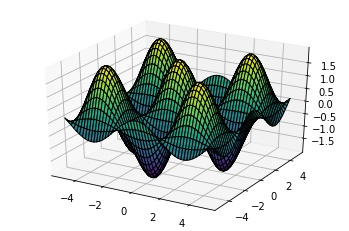

In [26]:
def plot_2d_standing_wave():

    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    import numpy as np
    
    fig = plt.figure('Optical Lattice')
    axis = fig.add_subplot(111, projection='3d')

    x = np.linspace(-5, 5, 1000)
    y = np.linspace(-5, 5, 1000)
   
    X, Y = np.meshgrid(x, y)
    Z = np.cos(X + Y) + np.cos(X - Y)

    axis.plot_surface(X, Y, Z, cmap = 'viridis', edgecolors = 'k')
    
plot_2d_standing_wave()

The following picture shows 9 particles trapped in standing waves of light. This is achieved using a so-called magneto-optical trap.

https://en.wikipedia.org/wiki/Magneto-optical_trap

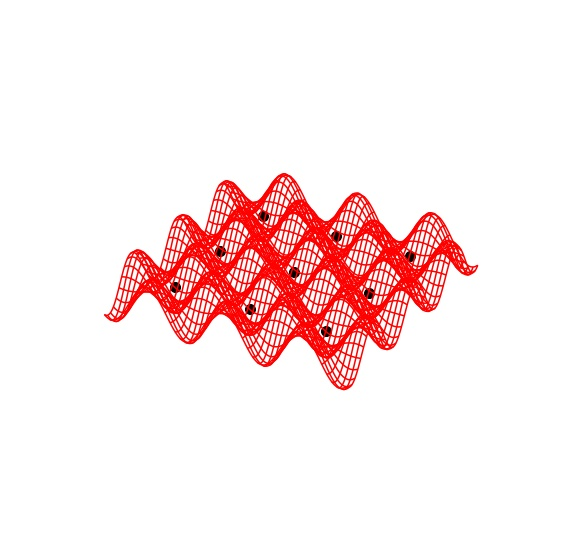

In [27]:
def plot_2d_wireframe():

    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    import numpy as np

    fig = plt.figure('Optical Lattice', figsize = (10, 10))
    axis = fig.add_subplot(111, projection='3d')
    axis.set_zlim(-10, 10)
    axis.axis('off')

    x = np.linspace(-10, 10, 1000)
    y = np.linspace(-10, 10, 1000)

    X, Y = np.meshgrid(x, y)
    Z = -np.cos(X + Y) - np.cos(X - Y)

    #Plot wireframe
    axis.plot_wireframe(X, Y, Z, color = 'r', rstride = 20, cstride = 20, zorder = 0)

    #Scatter particles
    for i in np.arange(-2 * np.pi, 3 * np.pi, 2*np.pi):
        for j in np.arange(-2 * np.pi, 3 * np.pi, 2*np.pi):
                axis.scatter(i, j, 0, color='k', s = 100, zorder = 1)
                
plot_2d_wireframe()
            

### TORUS

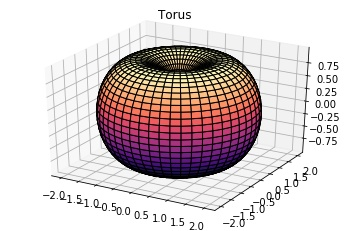

In [28]:
def plot_torus():
    
    import matplotlib.pyplot as plt, numpy as np 
    from mpl_toolkits.mplot3d import Axes3D

    phi = np.linspace(0, 2 * np.pi)
    theta = np.linspace(0, 2 * np.pi)
    phi, theta = np.meshgrid(phi, theta)

    a, c = 1, 1

    x = (c + a * np.cos(theta)) * np.cos(phi)
    y = (c + a * np.cos(theta)) * np.sin(phi)
    z = a * np.sin(theta)

    fig = plt.figure()
    axis = fig.add_subplot(111, projection = '3d')
    axis.set_title('Torus')

    axis.plot_surface(x, y, z, cmap = 'magma', edgecolors = 'k')
    
plot_torus()

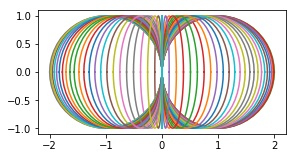

In [29]:
def plot_torus_section():

    import matplotlib.pyplot as plt
    import numpy as np
    
    phi = np.linspace(0, 2 * np.pi)
    theta = np.linspace(0, 2 * np.pi)
    phi, theta = np.meshgrid(phi, theta)

    c, a = 1, 1

    x = (c + a * np.cos(theta)) * np.cos(phi)
    y = (c + a * np.cos(theta)) * np.sin(phi)
    z = a * np.sin(theta)

    fig2 = plt.figure(figsize = (5, 5))

    axis2 = fig2.add_subplot(212)
    axis2.plot(y, z)
    axis2.set_aspect('equal')

    plt.show()
    
plot_torus_section()

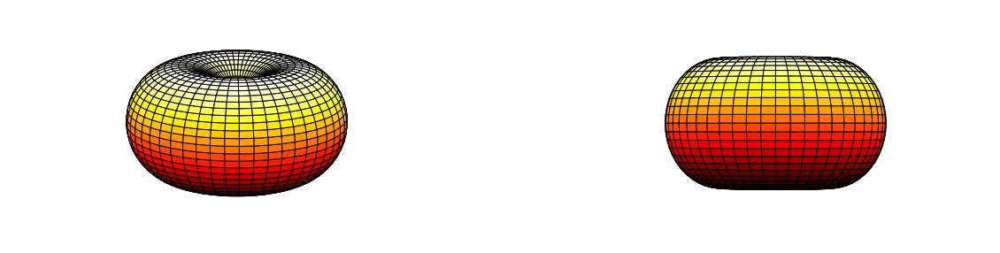

In [30]:
def plot_torus_with_sideview():

    import matplotlib.pyplot as plt, numpy as np 
    from mpl_toolkits.mplot3d import Axes3D

    phi = np.linspace(0, 2 * np.pi)
    theta = np.linspace(0, 2 * np.pi)
    phi, theta = np.meshgrid(phi, theta)

    a, c = 1, 1

    x = (c + a * np.cos(theta)) * np.cos(phi)
    y = (c + a * np.cos(theta)) * np.sin(phi)
    z = a * np.sin(theta)

    fig = plt.figure(figsize = (20, 5))
    axis1 = fig.add_subplot(121, projection = '3d')
    axis2 = fig.add_subplot(122, projection = '3d')

    axis1.plot_surface(x, y, z, cmap = 'hot', edgecolors = 'k')
    axis2.plot_surface(x, y, z, cmap = 'hot', edgecolors = 'k')

    axis1.axis('off')
    axis2.axis('off')

    axis2.view_init(0, 0)
    
plot_torus_with_sideview()

### APPENDIX 2: DRAWING BRAIDS WITH TURTLE GRAPHICS

Turtle graphics is a popular way for introducing programming to kids. It was part of the original Logo programming language developed by Wally Feurzig and Seymour Papert in 1966.

Imagine a robotic turtle starting at (0, 0) in the x-y plane. After an import turtle, give it the command turtle.forward(15), and it moves 15 pixels in the direction it is facing, drawing a line as it moves. Give it the command turtle.right(25), and it rotates in-place 25 degrees clockwise.

This is actually the very first approach that I took in order to draw my first braid objects. However, it soon became evident that I was going to run into some major brick walls if I continued developing this method, so I switched to Matplotlib.

In [31]:
def DrawBraidWithTurtle(braid, colors = False):
    
    import numpy as np
    from turtle import Turtle, Screen
    
    UPPER_CORN_X = len(braid.strands)
    UPPER_CORN_Y = len(braid.history) * 1.5
    LOWER_CORN_X = -1
    LOWER_CORN_Y = -1
    
    COLORS = ['#FFE119', '#0082C8', '#E6194B', '#3CB44B', '#F58231', '#911EB4',
              '#46F0F0', '#FABEBE', '#008080', '#FFFAC8', '#800000', '#E6BEFF',
              '#AA6E28', '#F032E6', '#D2F53C', '#AAFFC3', '#808000', '#FFD8B1',
              '#000080', '#808080', '#000000']

    screen = Screen()
    screen.setworldcoordinates(LOWER_CORN_X, LOWER_CORN_Y, UPPER_CORN_X, UPPER_CORN_Y)
    
    pen = Turtle(visible = False)
    Count = 0
    
    for string in braid:
        
        pen.goto(Count, 0)
        pen.pensize(2)
        
        if (colors == True):
            pen.color(COLORS[Count])
        
        pen.pendown()
        pen.speed('normal')
        
        for movement in string:
            
            if movement == 'RO':
                pen.setheading(90)
                pen.forward(0.25)
                pen.setheading(45)
                pen.forward(np.sqrt(2))
                pen.setheading(90)
                pen.forward(0.25)
                
            elif movement == 'RU':
                pen.setheading(90)
                pen.forward(0.25)
                pen.setheading(45)
                pen.forward(0.50)
                pen.penup()
                pen.forward(np.sqrt(2) - 1)
                pen.pendown()
                pen.forward(0.50)
                pen.setheading(90)
                pen.forward(0.25)
                
            elif movement == 'LO':
                pen.setheading(90)
                pen.forward(0.25)
                pen.setheading(135)
                pen.forward(np.sqrt(2))
                pen.setheading(90)
                pen.forward(0.25)
                
            elif movement == 'LU':
                pen.setheading(90)
                pen.forward(0.25)
                pen.setheading(135)
                pen.forward(0.50)
                pen.penup()
                pen.forward(np.sqrt(2) - 1)
                pen.pendown()
                pen.forward(0.50)
                pen.setheading(90)
                pen.forward(0.25)
                
            elif movement == 'NO':
                pen.setheading(90)
                pen.forward(1.5)
            
        pen.penup()
        Count += 1

    screen.mainloop()

#### TESTING

In [33]:
#DrawBraidWithTurtle(braid(2, [1, 1], colors = True))

## DOCUMENTATION

##### BRAID CLASS

<br />

> \__init__

    Name: __init__(self, generators, periodic, fusion)

    Type: Data model method belonging to the braid class

    Arguments: generators    ->       list of generators for the braid object
               periodic      ->       boolean value enabling cross-boundary periodicity of the strands
               fusion        ->       boolean value enabling fusion of the strands
               
    Description: Constructor method for the generalized braid object. The list of generators doesn't just
                 contain generators in the "Artin" sense of a braid group. If periodic is True, it may contain
                 periodic edge-crossing generators. If fusion is True, it may contain fusion generators.

    Return Value: None

<br />

> append_history

    Name: append_history(str_order)

    Type: Subroutine belonging to the build method of the braid class

    Arguments: str_order    ->       the array encoding the positions of the strands. 
    
    Description: Creates an entry in braid.history, copying the values of str_order
                 into it. Used for storing the position sequence of the strands.

    Return Value: None

<br />

> exchange_standard
    
    Name: exchange_standard(not_inverse)

    Type: Subroutine belonging to the build method of the braid class

    Description: Creates an entry in braid.history. This entry should be itself an array,
                 storing the positions of the strands.

    Arguments: str_order is the array encoding the positions of the strands. 

    Return Value: None


### OBSOLETE CODE

In [ ]:
class lattice:
     
        
    def __init__(self, height, width, nparticles):
        
        self.width = width
        self.height = height
        self.nparticles = nparticles
    
    
    def RandomTimeEvolution(self, time, projection):
        
        import numpy as np
        import random
        
        '''
        Initialize storage arrays:
            
            self.History          Array containing particle coordinates at all points within the
                                  time-evolution domain (0 to len(self.TimeSteps))
            self.ParticleOrder    
        '''
        
        #Fix the inputs by seeding the RNG with a constant (for testing)
        random.seed(1225344)#1225342 (25x25, 3 particles)
        
        self.particle_sequence = []
        self.history = []
        self.OrderHistory = []
        self.crossedns = False
        self.crossedwe = False
        
        self.ParticleOrder = list(range(self.nparticles))
        self.TimeSteps = list(range(time + 1))
        
        #Create a W x H array with the coordinates of each possible position in the lattice
        __AllCoordinates = []
        
        for x, y in np.ndindex(self.width, self.height):
            
            __AllCoordinates.append([x, y])
        
                
        #Initialize quasiparticle positions at random, sampling without repetition from the 
        #above-defined coordinate matrix. The sampled positions will be sorted according to their x-component
            
        from copy import deepcopy
        
        self.QParticles = sorted(random.sample(__AllCoordinates, self.nparticles), key=lambda x: x[0])
        self.history.append(deepcopy(self.QParticles))
        self.OrderHistory.append(deepcopy(self.ParticleOrder))
        
        

        def ChooseDirection(pidx, p):
        
            POSSIBILITIES = ['N', 'S', 'W', 'E']
            
            #Choose where to go
            choice = random.choice(POSSIBILITIES)
            
            if (choice == 'N'):
                p[1] = 0 if (p[1] + 1 > self.height - 1) else p[1] += 1
                    
            elif (choice == 'S'):  
                p[1] = (self.height - 1) if (p[1] - 1 < 0) else p[1] -= 1

            elif (choice == 'W'):
                p[0] = (self.width - 1) if (p[0] - 1 < 0) else p[0] -= 1
                    
            elif (choice == 'E'):
                p[0] = 0 if (p[0] + 1 > self.width - 1) else: p[0] += 1

                    

        '''END OF FUNCTION DEFINITION'''
        
        
        #Random time evolution of arbitrary duration
        for t in self.TimeSteps[1:]:

            for pidx, p in enumerate(self.QParticles):
            
                ChooseDirection(pidx, p)
            
            #Store updated particle positions
            self.history.append(deepcopy(self.QParticles))
        
        
        
        '''
        Algorithm: TODO: Explain algorithm
        
        '''
        
        self.Generators = []
        
        if (projection == 'XZ'):
            
            for t in self.TimeSteps[1:]:
                
                self.ParticleOrder.sort(key=lambda x: self.history[t][x][0])
                self.OrderHistory.append(self.ParticleOrder.copy())
            
                if (self.WalkOffWE[t] != 'na'):

                    print('ok')

                    if self.history[t][-1][1] > self.history[t][0][1]:
                        self.Generators.append(self.nparticles)
                    elif self.history[t][-1][1] < self.history[t][0][1]:
                        self.Generators.append(-self.nparticles)
                    else:
                        print('error')
                        exit()

                    for idx in range(self.nparticles - 1):

                        for x in range(self.OrderHistory[t-1].index(self.OrderHistory[t][idx]), idx, -1):

                            if (self.history[t][idx][1] > self.history[t][idx-1][1]):
                                self.Generators.append(-x)
                            elif (self.history[t][idx][1] < self.history[t][idx-1][1]):
                                self.Generators.append(x)
                            else:
                                self.Generators.append(x) #Totally arbitrary for an exchange with equal y
                                                          #Must be fixed in ChooseDirection

                else:

                    for idx in range(self.nparticles):

                        for x in range(self.OrderHistory[t-1].index(self.OrderHistory[t][idx]), idx, -1):

                            if (self.history[t][self.OrderHistory[t][idx + 1]][1] > self.history[t][self.OrderHistory[t][idx]][1]):
                                self.Generators.append(x)
                            elif (self.history[t][self.OrderHistory[t][idx + 1]][1] < self.history[t][self.OrderHistory[t][idx]][1]):
                                self.Generators.append(-x)
                            else:
                                if (self.history[t][self.OrderHistory[t-1][idx + 1]][1] > self.history[t-1][self.OrderHistory[t][idx]][1]):
                                    self.Generators.append(x)
                                elif (self.history[t][self.OrderHistory[t-1][idx + 1]][1] < self.history[t-1][self.OrderHistory[t][idx]][1]):
                                    self.Generators.append(-x)
                                else:
                                    self.Generators.append(x) #Totally arbitrary for an exchange with equal y
                                    #Must be fixed in ChooseDirection

        
        return (self.Generators)
        
        
        
    def PrintPositionHistory(self):
        
        print('POSITION HISTORY:')
                    
        if (len(self.TimeSteps) < 100): 
            for idx, positions in enumerate(self.History):
                print('t = {}:\t{}'.format(idx, positions))
                
        else:
            for idx, positions in enumerate(self.History):
                print('t = {}:\t\t{}'.format(idx, positions)) if idx < 100 else print('t = {}:\t{}'.format(idx, positions))
    
    
    
    def PrintOrderHistory(self):
        
        print('ORDER HISTORY:')
        
        if (len(self.TimeSteps) < 100): 
            for idx, order in enumerate(self.OrderHistory):
                print('t = {}:\t{}'.format(idx, order))
                
        else:
            for idx, order in enumerate(self.OrderHistory):
                print('t = {}:\t\t{}'.format(idx, order)) if idx < 100 else print('t = {}:\t{}'.format(idx, order))
                
                
                
    def PrintGenerators(self):
        
        print('GENERATORS:')
        
        for gen in self.Generators:
            print(gen)
            

In [ ]:
    def show(self):
              
        from mpl_toolkits.mplot3d import Axes3D
        import matplotlib.pyplot as plt
        
        fig = plt.figure('Braiding Visualization')
        ax = fig.add_subplot( 111, projection='3d' )
        
        for row in self.InitialState.Points:
            for col in row:
                if (col != []):
                    ax.scatter( col[ 0 ], col[ 1 ], 0, s=8, c = 'b', alpha = 0.8 )
        
        for row in self.FinalState.Points: 
            for col in row:  
                if (col != []):
                    ax.scatter( col[ 0 ], col[ 1 ], self.Separation, s = 8, c = 'r', alpha = 0.8 )

        if (self.InitialState.particle):          
            for hole in self.InitialState.Holes:
                ax.scatter(hole[0], hole[1], 0, s = 40, c = 'k', marker = '+', alpha = 0.1)
            for hole in self.FinalState.Holes:
                ax.scatter(hole[0], hole[1], self.Separation, s = 40, c = 'k', marker = '+', alpha = 0.1)
        
        plt.axis('off')
        plt.show()